# Image Caption Generation

### Importing required packages

In [1]:
import numpy as np
import pandas as pd
import spacy
from collections import Counter, OrderedDict
import os
from pathlib import Path
import torch
import torch.nn as nn 
import torchvision
from torchvision import models
from torch.utils.data import DataLoader, Dataset
from torchtext.vocab import vocab
from torch.nn.utils.rnn import pad_sequence
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.model_selection import train_test_split

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Hyperparameters

In [3]:
MAX_VOCAB_SIZE = 20000
THRESHOLD_FREQ = 0
BATCH_SIZE = 32

### Importing caption data

In [4]:
df = pd.read_csv('/kaggle/input/flickr8k/captions.txt')
df.head()

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [5]:
train_df, test_df = train_test_split(df, test_size = 0.1, random_state=42, shuffle = True)
train_df, valid_df = train_test_split(train_df, test_size = 0.1, random_state = 42, shuffle = True)

In [6]:
train_df = train_df.reset_index(drop = True)
valid_df = valid_df.reset_index(drop = True)
test_df = test_df.reset_index(drop = True)

### Root path for images

In [7]:
root_path = '/kaggle/input/flickr8k/Images'

### Tokenizer

In [8]:
nlp = spacy.load("en_core_web_sm")

def tokenizer(text):
    return [token.text.lower() for token in nlp.tokenizer(text)]

### Vocabulary class

In [9]:
class Vocabulary:    
    def __init__(self):
        self.vocabulary = None 
        
    def build_vocabulary(self, sentences):
        token_counter = Counter()
        for sentence in sentences:
            token_counter.update(tokenizer(sentence))
        sorted_by_freq_tuples = sorted(token_counter.items(), key=lambda x: x[1], reverse=True)[:MAX_VOCAB_SIZE]
        ordered_dict = OrderedDict(sorted_by_freq_tuples)
        specials = ['<PAD>', '<SOS>', '<EOS>', '<UNK>']
        self.vocabulary = vocab(ordered_dict, specials=specials, min_freq=THRESHOLD_FREQ)
        self.vocabulary.set_default_index(self.vocabulary['<UNK>'])
    
    def numericalize(self, sentence):
        tokenized_sentence = tokenizer(sentence)
        return [self.vocabulary[token] if token in self.vocabulary else self.vocabulary['<UNK>'] for token in tokenized_sentence] 
    
    def denumericalize(self, list):
        return [self.vocabulary.get_itos()[idx] if idx < len(self.vocabulary) else '<UNK>' for idx in list ]

In [10]:
v1 = Vocabulary()
v1.build_vocabulary(train_df['caption'].to_list())

### Custom Dataset

In [11]:
class CustomDataset(Dataset):
    def __init__(self, root_path, captions_df, transform=None):
        super().__init__()
        self.root_path = root_path
        self.df = captions_df 
        self.transform = transform
        
        self.image_names = self.df['image']
        self.captions = self.df['caption']
        
        self.v1 = Vocabulary()
        self.v1.build_vocabulary(self.captions.to_list())
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, index):
        image_name = self.image_names[index]
        rgb_image = Image.open(Path(os.path.join(self.root_path, image_name))).convert('RGB')
        
        if self.transform is not None:
            rgb_image = self.transform(rgb_image)
            
        caption = self.captions[index]
        
        numericalized_caption = [self.v1.vocabulary['<SOS>']]
        numericalized_caption.extend(self.v1.numericalize(caption))
        numericalized_caption.append(self.v1.vocabulary['<EOS>'])
        
        return rgb_image, torch.tensor(numericalized_caption)

### Image Transform and dataset

In [12]:
img_transforms = {
    'train': torchvision.transforms.Compose([
        torchvision.transforms.RandomResizedCrop(256, scale=(0.95, 1.0)),
        torchvision.transforms.RandomRotation(10),
        torchvision.transforms.CenterCrop(size=224),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(
            mean = [0.485, 0.456, 0.406],
            std = [0.229, 0.224, 0.225]
        )
    ]),
    
    'valid': torchvision.transforms.Compose([
        torchvision.transforms.Resize(256),
        torchvision.transforms.CenterCrop(size=224),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(
            mean = [0.485, 0.456, 0.406],
            std = [0.229, 0.224, 0.225]
        )
    ]),
        
    'test': torchvision.transforms.Compose([
        torchvision.transforms.Resize(256),
        torchvision.transforms.CenterCrop(size=224),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(
            mean = [0.485, 0.456, 0.406],
            std = [0.229, 0.224, 0.225]
        )
    ])
}
train_dataset = CustomDataset(root_path, train_df, img_transforms['train'])

In [13]:
print(f'Shape of Image tensor : {train_dataset[0][0].shape}')

Shape of Image tensor : torch.Size([3, 224, 224])


In [14]:
print(f'Shape of Caption tensor : {train_dataset[0][1].shape}')

Shape of Caption tensor : torch.Size([19])


### Creating collate function for DataLoader

In [15]:
batch_size = 16
x = [train_dataset[i][0].unsqueeze(0) for i in range(batch_size)]
y = [train_dataset[i][1].unsqueeze(0) for i in range(batch_size)]
batch = [[train_dataset[i][0], train_dataset[i][1] ]for i in range(batch_size)]

In [16]:
for i in range(16):
    print(i, f'| Image tensor shape: {batch[i][0].shape}', f' | Caption tensor shape: {batch[i][1].shape}')

0 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([19])
1 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([19])
2 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([27])
3 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([12])
4 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([11])
5 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([15])
6 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([18])
7 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([9])
8 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([11])
9 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch.Size([15])
10 | Image tensor shape: torch.Size([3, 224, 224])  | Caption tensor shape: torch

In [17]:
print(f'Image batch shape (from dataloader) = {torch.cat([item[0].unsqueeze(0) for item in batch], dim=0).shape}')

Image batch shape (from dataloader) = torch.Size([16, 3, 224, 224])


In [18]:
targets = [item[1] for item in batch]
targets = pad_sequence(targets, batch_first=True, padding_value=0)
print(f'Caption batch shape (from dataloader) = {targets.shape}')

Caption batch shape (from dataloader) = torch.Size([16, 27])


In [19]:
class Collate:
    def __init__(self, pad_idx) :
        self.pad_idx = pad_idx 
    
    def __call__(self, batch):
        images = torch.cat([item[0].unsqueeze(0) for item in batch], dim=0)
        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=True, padding_value=self.pad_idx)
        return images, targets 

In [20]:
collate_fn = Collate(0)
out = collate_fn(batch)
print(f'Image batch shape (from dataloader) = {out[0].shape}')
print(f'Caption batch shape (from dataloader) = {out[1].shape}')

Image batch shape (from dataloader) = torch.Size([16, 3, 224, 224])
Caption batch shape (from dataloader) = torch.Size([16, 27])


### DataLoader

In [21]:
def get_dataloader(root_path, captions_df, transform, batch_size, shuffle=True):
    dataset = CustomDataset(root_path, captions_df, transform)
    pad_idx = dataset.v1.vocabulary['<PAD>']
    dataloader = DataLoader(
        dataset = dataset,
        batch_size = batch_size,
        shuffle = shuffle,
        collate_fn = Collate(pad_idx=pad_idx)
    )
    return dataloader

In [22]:
train_data_loader = get_dataloader(root_path, train_df, img_transforms['train'], BATCH_SIZE)
valid_data_loader = get_dataloader(root_path, valid_df, img_transforms['valid'], BATCH_SIZE)
test_data_loader = get_dataloader(root_path, test_df, img_transforms['test'], BATCH_SIZE)

In [23]:
batch = next(iter(train_data_loader))
print(f'Image batch shape = {batch[0].shape}')
print(f'Text batch shape = {batch[1].shape}')

Image batch shape = torch.Size([32, 3, 224, 224])
Text batch shape = torch.Size([32, 25])


### Encoder

In [24]:
class Encoder(nn.Module):
    def __init__(self, embed_size, train_image_model = False) :
        super(Encoder, self).__init__()
        self.train_image_model = train_image_model 
        self.efficient_net_model = models.efficientnet_v2_m(weights='DEFAULT')
        self.efficient_net_model.classifier[1] = nn.Linear(self.efficient_net_model.classifier[1].in_features, embed_size)
        for name, params in self.efficient_net_model.named_parameters():
            if name == 'classifier.1.weight' or name == 'classifier.1.bias':
                params.requires_grad = True 
            else:
                params.requires_grad = self.train_image_model
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)
        
    def forward(self, images):
        # images_size = [batch_size, 3, 224, 224]
        x = self.efficient_net_model(images)
        x = self.relu(x)
        x = self.dropout(x)
        # x_size = [batch_size, embed_size]
        return x         

In [25]:
vocab_size = len(v1.vocabulary)
embed_size = 256
hidden_size = 128
num_layers = 1

In [26]:
enc = Encoder(embed_size)
encoded = enc(batch[0])

Downloading: "https://download.pytorch.org/models/efficientnet_v2_m-dc08266a.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_m-dc08266a.pth
100%|██████████| 208M/208M [00:03<00:00, 70.8MB/s] 


In [27]:
print(f'Image batch shape = {batch[0].shape}')
print(f'Image batch shape after encoding = {encoded.shape}')

Image batch shape = torch.Size([32, 3, 224, 224])
Image batch shape after encoding = torch.Size([32, 256])


### Decoder

In [28]:
class Decoder(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers):
        super(Decoder, self).__init__()
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.dropout = nn.Dropout(0.5)
    
    def forward(self, features, captions):
        # features_size = [batch_size, embed_size]
        embeddings = self.embed(captions)
        # embeddings_size = [batch_size, batch_length, embed_size]
        embeddings = torch.cat((features.unsqueeze(1), embeddings), dim=1)
        # embeddings_size = [batch_size, batch_length+1, embed_size]
        out, _ = self.lstm(embeddings)
        out = self.linear(out)
        # out_size = [batch_size, batch_length+1, vocab_size]
        return out

In [29]:
dec = Decoder(embed_size, hidden_size, vocab_size, num_layers)
decoded = dec(encoded, batch[1])

In [30]:
print(f'Image batch shape = {batch[0].shape}')
print(f'Text batch shape = {batch[1].shape}')
print(f'Batch shape after decoding = {decoded.shape}')

Image batch shape = torch.Size([32, 3, 224, 224])
Text batch shape = torch.Size([32, 25])
Batch shape after decoding = torch.Size([32, 26, 7821])


### Encoder Decoder

In [31]:
class EncoderDecoder(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers):
        super(EncoderDecoder, self).__init__()
        self.encoder = Encoder(embed_size)
        self.decoder = Decoder(embed_size, hidden_size, vocab_size, num_layers)
        
    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs 
    
    def caption_generator(self, image, vocabulary_v1, max_length=50):
        result = []
        
        with torch.no_grad():
            x = self.encoder(image.unsqueeze(0))
            states = None 
            
            for _ in range(max_length):
                out, states = self.decoder.lstm(x, states)
                out = self.decoder.linear(out)
                predicted = torch.argmax(out, 1)
                result.append(predicted.item())
                x = self.decoder.embed(predicted)
                
                if predicted.item() == vocabulary_v1.vocabulary['<EOS>']:
                    break
            
        return ' '.join(vocabulary_v1.denumericalize(result))

In [32]:
vocab_size = len(v1.vocabulary)
embed_size = 256
hidden_size = 128
num_layers = 1
learning_rate = 0.001
num_epochs = 10
model = EncoderDecoder(embed_size, hidden_size, vocab_size, num_layers)
model.to(device)
loss_fn = nn.CrossEntropyLoss(ignore_index=v1.vocabulary['<PAD>'])
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [33]:
def save_checkpoint(state, filename='checkpoint.pth.tar'):
    torch.save(state, filename)

In [34]:
def load_checkpoint(filename = 'checkpoint.pth.tar'):
    checkpoint = torch.load(filename)
    model.load_state_dict(checkpoint['model'])
    optimizer.load_state_dict(checkpoint['optimizer'])
    return model, optimizer

In [35]:
def training(model, optimizer, loss_fn, train_data_loader, valid_df, load_model=False, save_model=False, num_epochs=100):
    if load_model:
        model, optimizer = load_checkpoint()
    for epoch in tqdm(range(num_epochs)):
        model.train()
        for batch_idx, batch in enumerate(train_data_loader):
            images = batch[0].to(device)
            captions = batch[1].to(device)
            output = model(images, captions)
            output = output[:, :-1, :]
            loss = loss_fn(output.reshape(-1, output.shape[2]), captions.reshape(-1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if batch_idx % 100 == 0 :
                print(f'Epoch No. {epoch+1}/{num_epochs} | Batch No. {batch_idx}/{len(train_data_loader)} | Loss = {loss:.5f}')
        checkpoint = {
            'model'     : model.state_dict(),
            'optimizer' : optimizer.state_dict()
        }
        if save_model:
            save_checkpoint(checkpoint)
        with torch.no_grad():
            model.eval()
            test_indices = np.random.randint(0, len(valid_df), 2)
            for idx in test_indices:
                image_name = valid_df.iloc[idx]['image']
                img = Image.open(Path(os.path.join('/kaggle/input/flickr8k/Images', image_name)))
                plt.imshow(img)
                plt.show()
                img = img_transforms['valid'](img)
                img = img.to(device)
                generated_caption = model.caption_generator(img, v1)
                print(f'Original Caption = {valid_df.iloc[idx]["caption"]}')
                print(f'Generated Caption = {generated_caption}')
    return model

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch No. 1/10 | Batch No. 0/1024 | Loss = 1.61086
Epoch No. 1/10 | Batch No. 100/1024 | Loss = 1.64389
Epoch No. 1/10 | Batch No. 200/1024 | Loss = 1.65998
Epoch No. 1/10 | Batch No. 300/1024 | Loss = 1.66578
Epoch No. 1/10 | Batch No. 400/1024 | Loss = 1.68880
Epoch No. 1/10 | Batch No. 500/1024 | Loss = 1.72682
Epoch No. 1/10 | Batch No. 600/1024 | Loss = 1.69421
Epoch No. 1/10 | Batch No. 700/1024 | Loss = 1.78854
Epoch No. 1/10 | Batch No. 800/1024 | Loss = 1.75432
Epoch No. 1/10 | Batch No. 900/1024 | Loss = 1.59978
Epoch No. 1/10 | Batch No. 1000/1024 | Loss = 1.65624


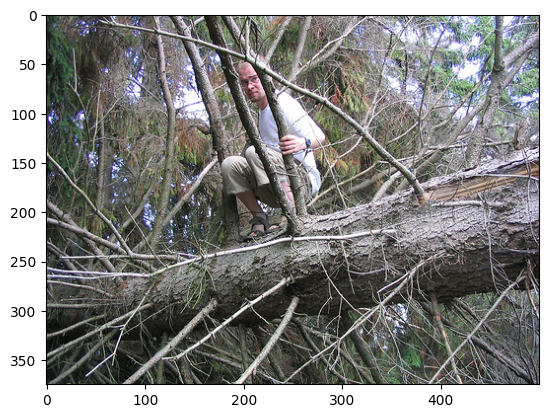

Original Caption = A man sitting in the middle of branches on a fallen tree .
Generated Caption = <SOS> a man in a red shirt is skateboarding down a ramp . <EOS>


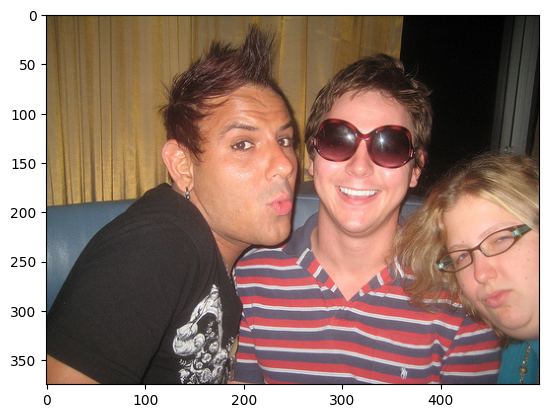

 10%|█         | 1/10 [05:25<48:48, 325.33s/it]

Original Caption = Young man with upturned hair posing with young man with sunglasses and woman with glasses
Generated Caption = <SOS> a man in a black shirt is standing in front of a crowd . <EOS>
Epoch No. 2/10 | Batch No. 0/1024 | Loss = 1.49347
Epoch No. 2/10 | Batch No. 100/1024 | Loss = 1.69477
Epoch No. 2/10 | Batch No. 200/1024 | Loss = 1.65466
Epoch No. 2/10 | Batch No. 300/1024 | Loss = 1.56847
Epoch No. 2/10 | Batch No. 400/1024 | Loss = 1.62351
Epoch No. 2/10 | Batch No. 500/1024 | Loss = 1.64638
Epoch No. 2/10 | Batch No. 600/1024 | Loss = 1.68278
Epoch No. 2/10 | Batch No. 700/1024 | Loss = 1.56533
Epoch No. 2/10 | Batch No. 800/1024 | Loss = 1.62418
Epoch No. 2/10 | Batch No. 900/1024 | Loss = 1.67615
Epoch No. 2/10 | Batch No. 1000/1024 | Loss = 1.55479


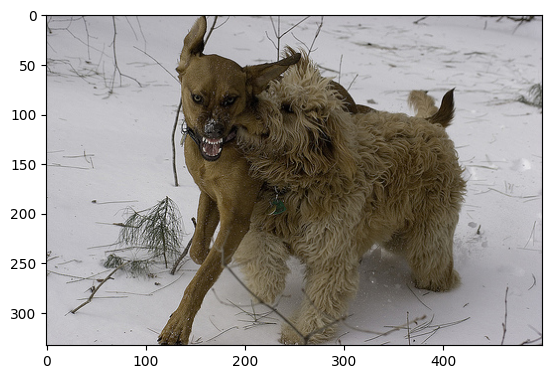

Original Caption = Two dogs are fighting in the snow .
Generated Caption = <SOS> a brown dog is running through a field . <EOS>


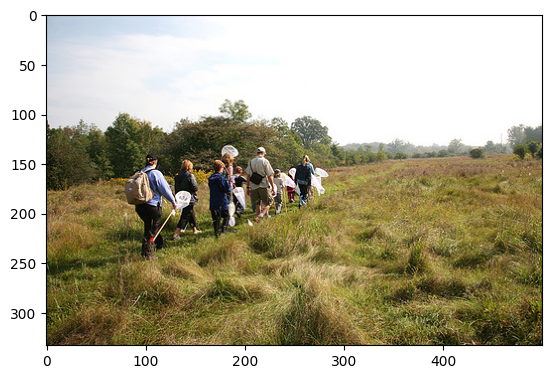

 20%|██        | 2/10 [10:50<43:20, 325.03s/it]

Original Caption = Several people in line walking through grass with nets in hand .
Generated Caption = <SOS> a group of people are standing on a beach . <EOS>
Epoch No. 3/10 | Batch No. 0/1024 | Loss = 1.64450
Epoch No. 3/10 | Batch No. 100/1024 | Loss = 1.73225
Epoch No. 3/10 | Batch No. 200/1024 | Loss = 1.62268
Epoch No. 3/10 | Batch No. 300/1024 | Loss = 1.58607
Epoch No. 3/10 | Batch No. 400/1024 | Loss = 1.61795
Epoch No. 3/10 | Batch No. 500/1024 | Loss = 1.62559
Epoch No. 3/10 | Batch No. 600/1024 | Loss = 1.61342
Epoch No. 3/10 | Batch No. 700/1024 | Loss = 1.68058
Epoch No. 3/10 | Batch No. 800/1024 | Loss = 1.72432
Epoch No. 3/10 | Batch No. 900/1024 | Loss = 1.71609
Epoch No. 3/10 | Batch No. 1000/1024 | Loss = 1.71491


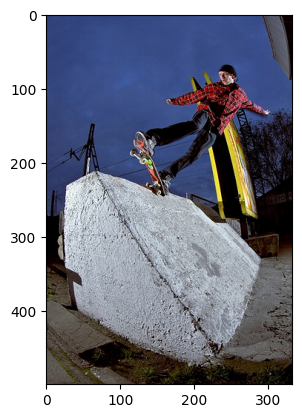

Original Caption = A boy skateboards up a concrete ramp .
Generated Caption = <SOS> a man in a red shirt is skateboarding on a ramp . <EOS>


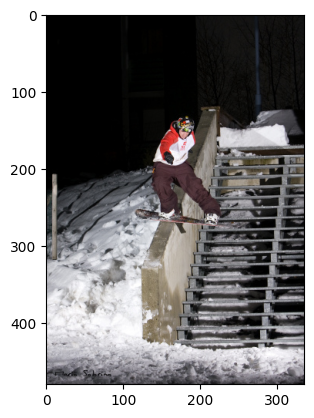

 30%|███       | 3/10 [16:20<38:10, 327.24s/it]

Original Caption = In the snow a person on a board traverses down a concrete wall beside bleachers .
Generated Caption = <SOS> a man in a red shirt is skateboarding on a ramp . <EOS>
Epoch No. 4/10 | Batch No. 0/1024 | Loss = 1.51366
Epoch No. 4/10 | Batch No. 100/1024 | Loss = 1.65202
Epoch No. 4/10 | Batch No. 200/1024 | Loss = 1.58577
Epoch No. 4/10 | Batch No. 300/1024 | Loss = 1.58352
Epoch No. 4/10 | Batch No. 400/1024 | Loss = 1.66312
Epoch No. 4/10 | Batch No. 500/1024 | Loss = 1.64626
Epoch No. 4/10 | Batch No. 600/1024 | Loss = 1.63132
Epoch No. 4/10 | Batch No. 700/1024 | Loss = 1.56563
Epoch No. 4/10 | Batch No. 800/1024 | Loss = 1.68005
Epoch No. 4/10 | Batch No. 900/1024 | Loss = 1.64461
Epoch No. 4/10 | Batch No. 1000/1024 | Loss = 1.59457


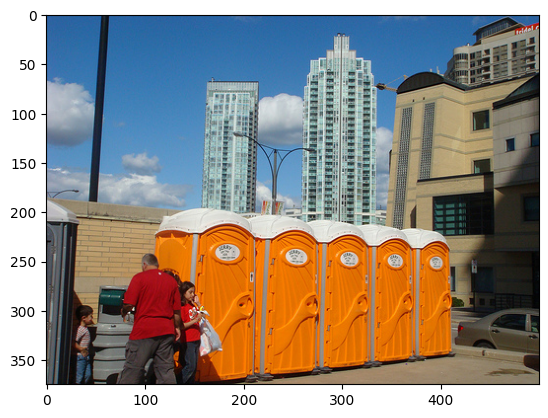

Original Caption = People standing by a row of orange portable toilets .
Generated Caption = <SOS> a man in a white shirt is standing in front of a large red bowling set . <EOS>


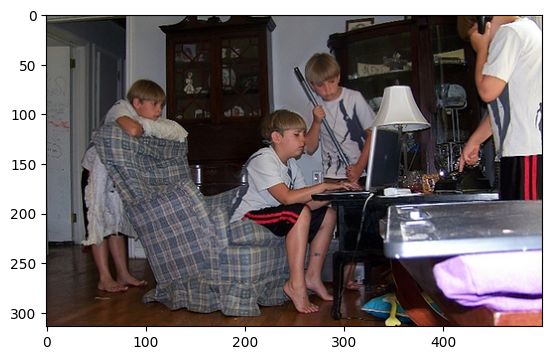

 40%|████      | 4/10 [21:49<32:49, 328.27s/it]

Original Caption = Three boys look at a laptop computer while a four talks on the phone .
Generated Caption = <SOS> a man in a white shirt is standing in front of a crowd of people . <EOS>
Epoch No. 5/10 | Batch No. 0/1024 | Loss = 1.54644
Epoch No. 5/10 | Batch No. 100/1024 | Loss = 1.59604
Epoch No. 5/10 | Batch No. 200/1024 | Loss = 1.54748
Epoch No. 5/10 | Batch No. 300/1024 | Loss = 1.58981
Epoch No. 5/10 | Batch No. 400/1024 | Loss = 1.59814
Epoch No. 5/10 | Batch No. 500/1024 | Loss = 1.56393
Epoch No. 5/10 | Batch No. 600/1024 | Loss = 1.64878
Epoch No. 5/10 | Batch No. 700/1024 | Loss = 1.54923
Epoch No. 5/10 | Batch No. 800/1024 | Loss = 1.64289
Epoch No. 5/10 | Batch No. 900/1024 | Loss = 1.44482
Epoch No. 5/10 | Batch No. 1000/1024 | Loss = 1.69355


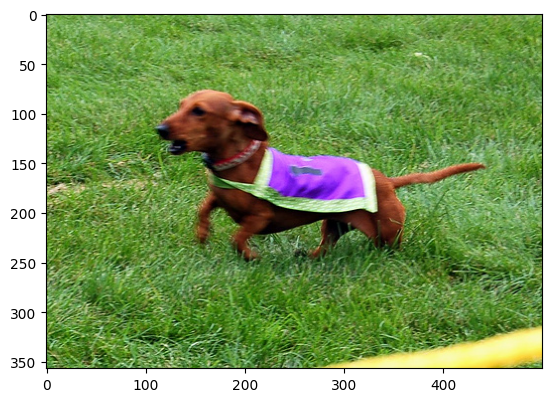

Original Caption = A miniature dachshund has an apron on its back .
Generated Caption = <SOS> a brown dog is running through a grassy field . <EOS>


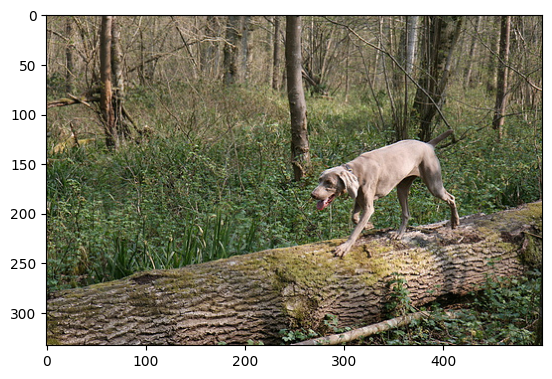

 50%|█████     | 5/10 [27:22<27:29, 329.82s/it]

Original Caption = A grey dog walks on top of a fallen tree in the woods .
Generated Caption = <SOS> a brown dog is running through a grassy field . <EOS>
Epoch No. 6/10 | Batch No. 0/1024 | Loss = 1.75781
Epoch No. 6/10 | Batch No. 100/1024 | Loss = 1.58116
Epoch No. 6/10 | Batch No. 200/1024 | Loss = 1.51936
Epoch No. 6/10 | Batch No. 300/1024 | Loss = 1.62278
Epoch No. 6/10 | Batch No. 400/1024 | Loss = 1.70639
Epoch No. 6/10 | Batch No. 500/1024 | Loss = 1.62134
Epoch No. 6/10 | Batch No. 600/1024 | Loss = 1.55342
Epoch No. 6/10 | Batch No. 700/1024 | Loss = 1.54537
Epoch No. 6/10 | Batch No. 800/1024 | Loss = 1.66571
Epoch No. 6/10 | Batch No. 900/1024 | Loss = 1.63910
Epoch No. 6/10 | Batch No. 1000/1024 | Loss = 1.68549


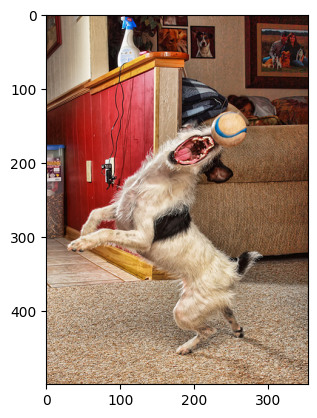

Original Caption = A white dog with black spots is catching a baseball with its mouth .
Generated Caption = <SOS> a dog is running through a field . <EOS>


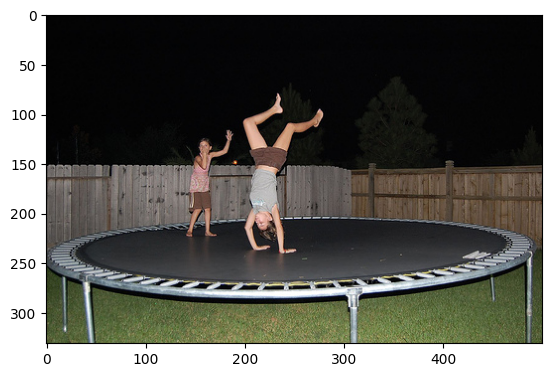

 60%|██████    | 6/10 [32:50<21:57, 329.27s/it]

Original Caption = The children are playing on the trampoline .
Generated Caption = <SOS> a man in a red shirt is rock climbing . <EOS>
Epoch No. 7/10 | Batch No. 0/1024 | Loss = 1.40350
Epoch No. 7/10 | Batch No. 100/1024 | Loss = 1.49149
Epoch No. 7/10 | Batch No. 200/1024 | Loss = 1.57645
Epoch No. 7/10 | Batch No. 300/1024 | Loss = 1.46932
Epoch No. 7/10 | Batch No. 400/1024 | Loss = 1.57160
Epoch No. 7/10 | Batch No. 500/1024 | Loss = 1.56344
Epoch No. 7/10 | Batch No. 600/1024 | Loss = 1.52797
Epoch No. 7/10 | Batch No. 700/1024 | Loss = 1.44262
Epoch No. 7/10 | Batch No. 800/1024 | Loss = 1.59134
Epoch No. 7/10 | Batch No. 900/1024 | Loss = 1.58843
Epoch No. 7/10 | Batch No. 1000/1024 | Loss = 1.63457


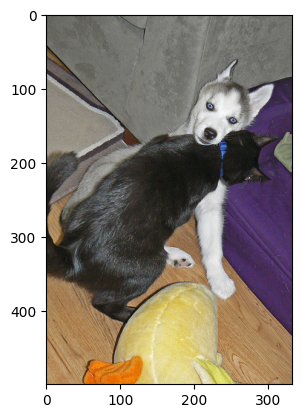

Original Caption = A black cat playing with a white puppy next to a duck toy .
Generated Caption = <SOS> a dog is running in a field . <EOS>


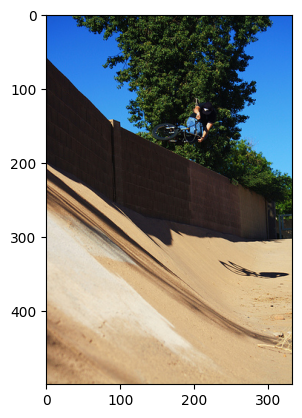

 70%|███████   | 7/10 [38:23<16:31, 330.59s/it]

Original Caption = A guy is doing a bike trick in a park .
Generated Caption = <SOS> a man in a red shirt is skateboarding in a skate park . <EOS>
Epoch No. 8/10 | Batch No. 0/1024 | Loss = 1.49976
Epoch No. 8/10 | Batch No. 100/1024 | Loss = 1.49408
Epoch No. 8/10 | Batch No. 200/1024 | Loss = 1.56533
Epoch No. 8/10 | Batch No. 300/1024 | Loss = 1.49649
Epoch No. 8/10 | Batch No. 400/1024 | Loss = 1.52755
Epoch No. 8/10 | Batch No. 500/1024 | Loss = 1.52388
Epoch No. 8/10 | Batch No. 600/1024 | Loss = 1.57277
Epoch No. 8/10 | Batch No. 700/1024 | Loss = 1.65542
Epoch No. 8/10 | Batch No. 800/1024 | Loss = 1.59044
Epoch No. 8/10 | Batch No. 900/1024 | Loss = 1.60068
Epoch No. 8/10 | Batch No. 1000/1024 | Loss = 1.64336


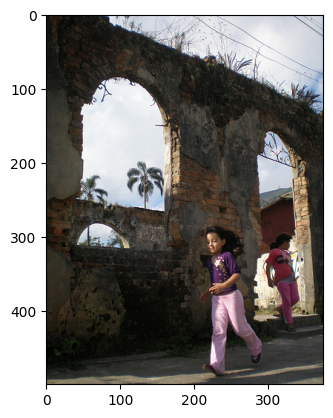

Original Caption = Two little girls play around an old abandoned building .
Generated Caption = <SOS> a man is standing on top of a mountain . <EOS>


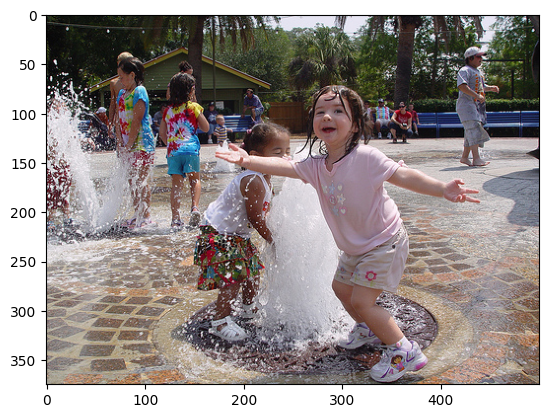

 80%|████████  | 8/10 [43:55<11:01, 330.98s/it]

Original Caption = A little girl with arms outstretched plays with others at a sprinkler park .
Generated Caption = <SOS> a boy in a blue shirt is playing with a soccer ball in the grass . <EOS>
Epoch No. 9/10 | Batch No. 0/1024 | Loss = 1.46029
Epoch No. 9/10 | Batch No. 100/1024 | Loss = 1.67620
Epoch No. 9/10 | Batch No. 200/1024 | Loss = 1.47243
Epoch No. 9/10 | Batch No. 300/1024 | Loss = 1.48693
Epoch No. 9/10 | Batch No. 400/1024 | Loss = 1.52233
Epoch No. 9/10 | Batch No. 500/1024 | Loss = 1.56518
Epoch No. 9/10 | Batch No. 600/1024 | Loss = 1.45387
Epoch No. 9/10 | Batch No. 700/1024 | Loss = 1.41935
Epoch No. 9/10 | Batch No. 800/1024 | Loss = 1.46676
Epoch No. 9/10 | Batch No. 900/1024 | Loss = 1.57261
Epoch No. 9/10 | Batch No. 1000/1024 | Loss = 1.60272


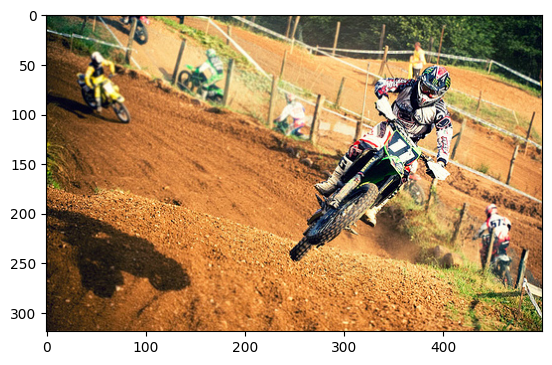

Original Caption = A dirt bike racer jumping off a hill with another racer not far behind .
Generated Caption = <SOS> a man is riding a dirt bike on a dirt path . <EOS>


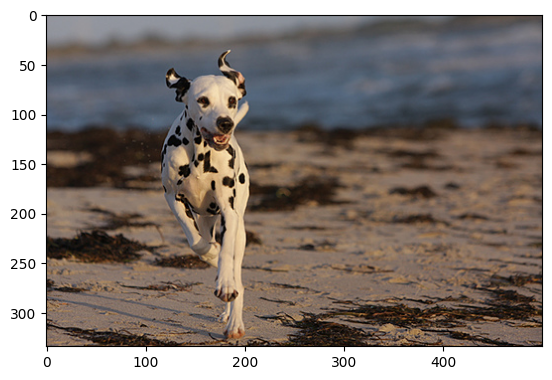

 90%|█████████ | 9/10 [49:29<05:31, 331.70s/it]

Original Caption = Dalmation running along the beach .
Generated Caption = <SOS> a white bird is flying over a body of water in a lake . <EOS>
Epoch No. 10/10 | Batch No. 0/1024 | Loss = 1.58420
Epoch No. 10/10 | Batch No. 100/1024 | Loss = 1.59195
Epoch No. 10/10 | Batch No. 200/1024 | Loss = 1.53198
Epoch No. 10/10 | Batch No. 300/1024 | Loss = 1.48016
Epoch No. 10/10 | Batch No. 400/1024 | Loss = 1.58687
Epoch No. 10/10 | Batch No. 500/1024 | Loss = 1.46797
Epoch No. 10/10 | Batch No. 600/1024 | Loss = 1.56134
Epoch No. 10/10 | Batch No. 700/1024 | Loss = 1.52614
Epoch No. 10/10 | Batch No. 800/1024 | Loss = 1.68346
Epoch No. 10/10 | Batch No. 900/1024 | Loss = 1.57463
Epoch No. 10/10 | Batch No. 1000/1024 | Loss = 1.51010


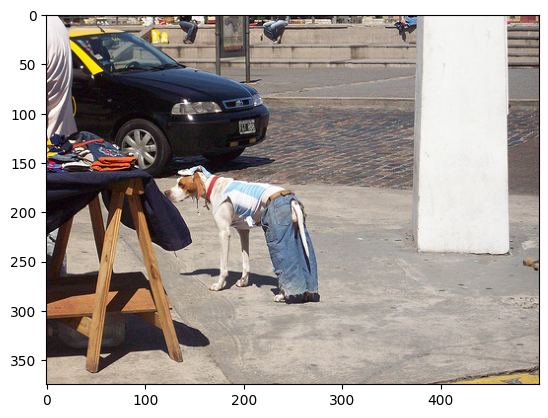

Original Caption = A dog wearing jeans and a shirt stands on the sidewalk .
Generated Caption = <SOS> a man in a red shirt is standing in front of a large crowd of people . <EOS>


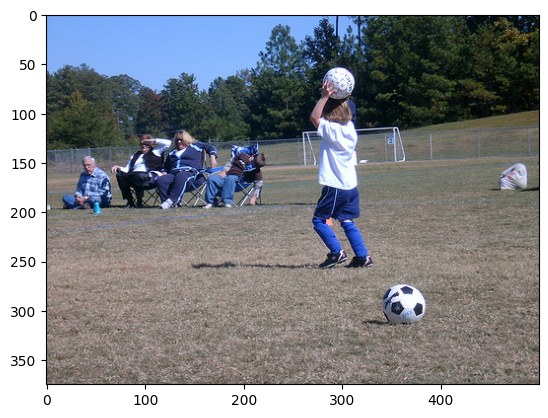

100%|██████████| 10/10 [55:01<00:00, 330.19s/it]

Original Caption = A boy throws a soccer ball from the sidelines in a soccer game .
Generated Caption = <SOS> a group of people are standing on a sidewalk near a large building . <EOS>


In [42]:
model = training(model, optimizer, loss_fn, train_data_loader, valid_df, load_model=True, save_model=True, num_epochs=10)

### Testing

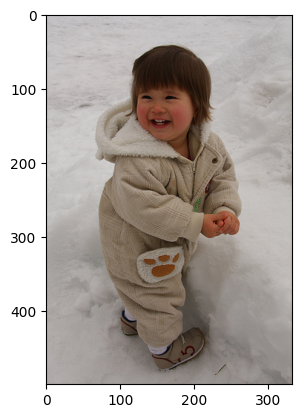

Original Caption = A toddler in a beige suit is smiling whilst playing in the snow .
Generated Caption = <SOS> a little girl in a pink dress is running on a field . <EOS>


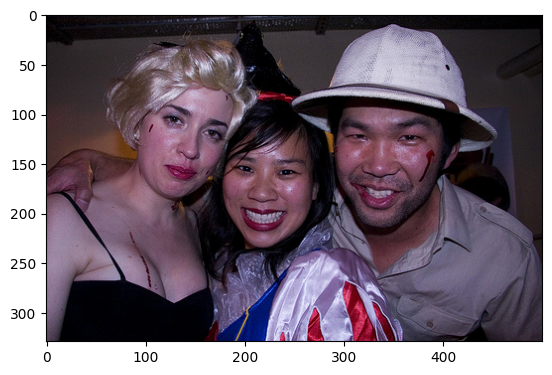

Original Caption = The man wears a white hat and poses with a blonde woman and a black haired woman .
Generated Caption = <SOS> a man and a woman are sitting on a bench . <EOS>


In [37]:
# After 10 Epochs
test_indices = np.random.randint(0, len(test_df), 2)
for idx in test_indices:
    image_name = test_df.iloc[idx]['image']
    img = Image.open(Path(os.path.join('/kaggle/input/flickr8k/Images', image_name)))
    plt.imshow(img)
    plt.show()
    img = img_transforms['test'](img)
    img = img.to(device)
    generated_caption = model.caption_generator(img, v1)
    print(f'Original Caption = {test_df.iloc[idx]["caption"]}')
    print(f'Generated Caption = {generated_caption}')

After 20 Epochs


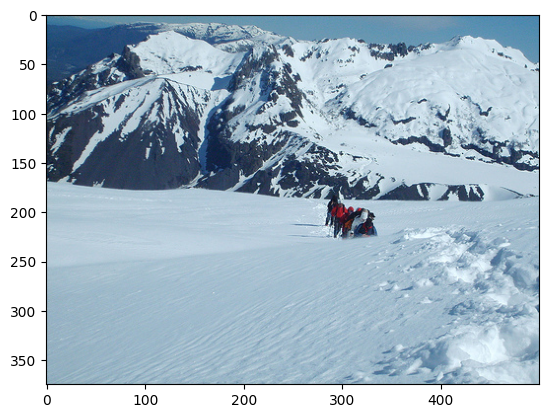

Original Caption = A group of mountain climbers
Generated Caption = <SOS> a snowboarder is in the air over a snowy hill . <EOS>


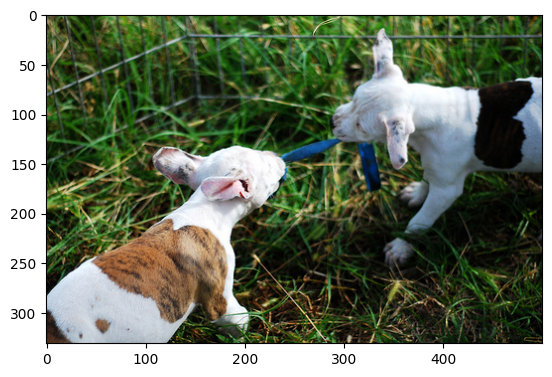

Original Caption = Two brown and white puppies are playing tug of war with a blue strip of fabric .
Generated Caption = <SOS> a dog is running through the grass . <EOS>


In [39]:
print('After 20 Epochs')
test_indices = np.random.randint(0, len(test_df), 2)
for idx in test_indices:
    image_name = test_df.iloc[idx]['image']
    img = Image.open(Path(os.path.join('/kaggle/input/flickr8k/Images', image_name)))
    plt.imshow(img)
    plt.show()
    img = img_transforms['test'](img)
    img = img.to(device)
    generated_caption = model.caption_generator(img, v1)
    print(f'Original Caption = {test_df.iloc[idx]["caption"]}')
    print(f'Generated Caption = {generated_caption}')

After 30 Epochs


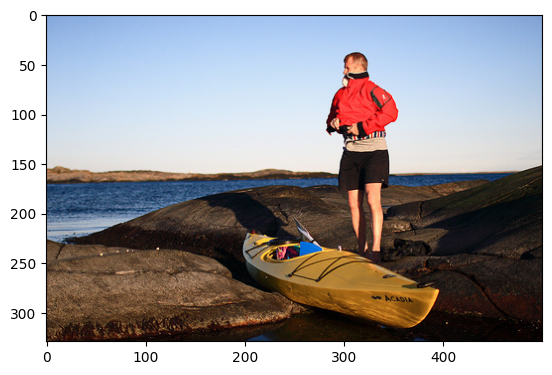

Original Caption = A man wearing a red jacket standing beside a yellow canoe on some rocks with water in the background
Generated Caption = <SOS> a man is standing on the beach by the ocean . <EOS>


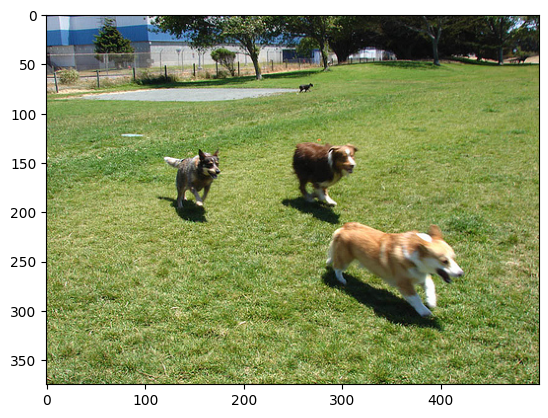

Original Caption = three dogs are running across the grass near to a blue industrial building .
Generated Caption = <SOS> a dog is running through the grass . <EOS>


In [41]:
print('After 30 Epochs')
test_indices = np.random.randint(0, len(test_df), 2)
for idx in test_indices:
    image_name = test_df.iloc[idx]['image']
    img = Image.open(Path(os.path.join('/kaggle/input/flickr8k/Images', image_name)))
    plt.imshow(img)
    plt.show()
    img = img_transforms['test'](img)
    img = img.to(device)
    generated_caption = model.caption_generator(img, v1)
    print(f'Original Caption = {test_df.iloc[idx]["caption"]}')
    print(f'Generated Caption = {generated_caption}')

After 40 Epochs


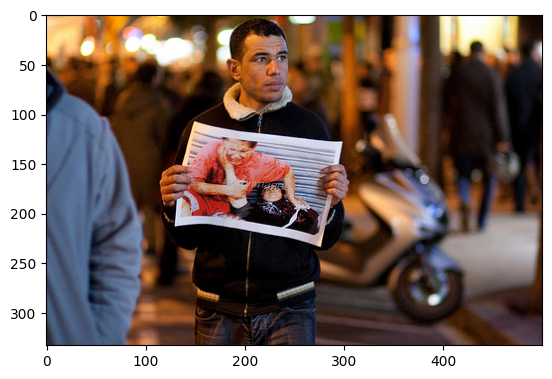

Original Caption = A man is standing in front of a motor-scooter holding up a picture .
Generated Caption = <SOS> a man in a black jacket is standing in front of a white brick building . <EOS>


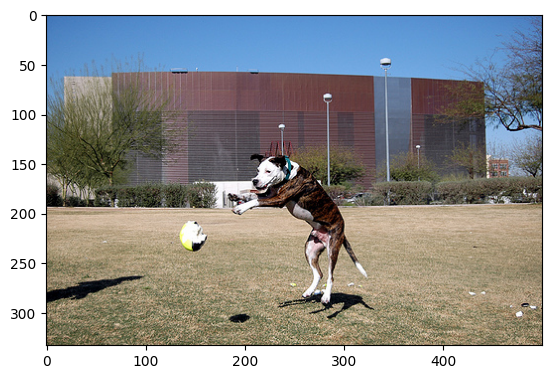

Original Caption = A dog jumps to catch a ball in a large field .
Generated Caption = <SOS> a dog jumps over a hurdle . <EOS>


In [43]:
print('After 40 Epochs')
test_indices = np.random.randint(0, len(test_df), 2)
for idx in test_indices:
    image_name = test_df.iloc[idx]['image']
    img = Image.open(Path(os.path.join('/kaggle/input/flickr8k/Images', image_name)))
    plt.imshow(img)
    plt.show()
    img = img_transforms['test'](img)
    img = img.to(device)
    generated_caption = model.caption_generator(img, v1)
    print(f'Original Caption = {test_df.iloc[idx]["caption"]}')
    print(f'Generated Caption = {generated_caption}')